# Colormaps of the YEO somatomotor network

In [1]:
# Set the environment
import os
import numpy as np
import nibabel as nb
from nibabel.freesurfer.mghformat import load
from brainspace.plotting import plot_hemispheres
from brainspace.mesh.mesh_io import read_surface
from brainspace.datasets import load_conte69
from brainspace.datasets.base import load_mask
from brainspace.gradient import GradientMaps
from brainspace.utils.parcellation import map_to_labels
from brainspace.mesh.array_operations import smooth_array
import matplotlib.pyplot as mpl
import matplotlib as plt
import seaborn as sns

# Set the working directory to the 'out' directory
os.chdir("/data_/mica3/BIDS_MICs/") 

# This variable will be different for each subject
derivatives='/data_/mica3/BIDS_MICs/derivatives'
out=derivatives+ '/micapipe_v0.2.0/'
recon='freesurfer'
sub='sub-PX072'
subjectID=sub+'_ses-01'
subjectDir=out + sub+'/ses-01'

# Here we define the atlas
atlas='schaefer-400'

# Load conte69
c69_lh, c69_rh = load_conte69()

# Read label for conte69
micapipe='/data_/mica1/01_programs/micapipe-v0.2.0'
labels_c69 = np.loadtxt(open(micapipe + '/parcellations/' + atlas + '_conte69.csv'), dtype=int)

# mask of the medial wall
mask_c69 = load_mask(join=True)

# Load annotation file in fsaverage5
annot_lh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/lh.'+atlas+'_mics.annot')
Ndim = max(np.unique(annot_lh_fs5[0]))
annot_rh_fs5= nb.freesurfer.read_annot(micapipe + '/parcellations/rh.'+atlas+'_mics.annot')[0]+Ndim


# fsLR-32k
c69_lhi = read_surface(micapipe + '/surfaces/fsLR-32k.L.inflated.surf.gii', itype='gii')
c69_rhi = read_surface(micapipe + '/surfaces/fsLR-32k.R.inflated.surf.gii', itype='gii')


In [4]:
# Smooth intencities
def smooth_surf(surf_l, surf_r, points, Mask, Kernel='uniform', Niter=3, Relax=0.35):
    '''
    This function smooth an array (left and right) on a given surface
    Parameters
    ----------
    surf_l : np.array left surface 
    surf_r : np.array right surface
    points : np.array surface data
    Kernel : {'uniform', 'gaussian', 'inverse_distance'}
    Niter  : int, optional Number of smooth iterations
    Relax  : relax : float, optional relaxation factor
    Mask   : str or 1D ndarray, optional
    Returns
    -------
    sdata : smoothed numpy array
    
    '''
    Ndim = Mask.shape[0] 
    n2dim = int(Ndim/2)
    Mask_l=Mask[0:n2dim]
    Mask_r=Mask[n2dim:Ndim]
    sdata = np.concatenate((smooth_array(surf_l, points[0:n2dim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_l), 
                          smooth_array(surf_r, points[n2dim:Ndim],kernel=Kernel, n_iter=Niter,relax=Relax, mask=Mask_r)), axis=0)
    return(sdata)

# YEO networks

In [5]:
# Load the cortical connectome
funcAcq='desc-se_task-rest_acq-AP_bold'
mtx_fs = nb.load(f'{subjectDir}/func/{funcAcq}/surf/{subjectID}_surf-fsLR-32k_atlas-{atlas}_desc-FC.shape.gii').darrays[0].data

# slice the matrix
FC = mtx_fs[49:, 49:]
#FC = np.delete(np.delete(FC, 200, axis=0), 200, axis=1)

# Fischer transformation
FCz = np.arctanh(FC)

# replace inf with 0
FCz[~np.isfinite(FCz)] = 0

# Mirror the matrix
FCz = np.triu(FCz,1)+FCz.T

# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

/host/yeatman/local_raid/temporaryLocalProcessing/ipykernel_19094/229604026.py:10: RuntimeWarning: divide by zero encountered in arctanh
  FCz = np.arctanh(FC)


In [8]:
# Load annotations
lh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/lh.' + atlas + '_mics.annot')
rh_lab = nb.freesurfer.io.read_annot(micapipe + '/parcellations/rh.' + atlas + '_mics.annot')
labs = lh_lab[2][1:] + rh_lab[2][1:]

# Plot each YEO network
netStrs = ['Vis', 'SomMot', 'Default', 'SalVentAttn', 'DorsAttn', 'Cont', 'Limbic' ]
networks = [None] * len(netStrs)

# Positive correlations
fc_pos = np.copy(FCz)
fc_pos[(0>fc_pos)] = 0

for i, netNom in enumerate(netStrs):
    print(str(i) + ' ' + netNom)
    indx = [netNom in str(x) for x in labs]
    net = np.sum(fc_pos[indx,:], axis=0)
    networks[i] = map_to_labels(net, labels_c69, fill=np.nan, mask=mask_c69)
    networks[i] = smooth_surf(c69_lhi, c69_rhi, networks[i], mask_c69, Kernel='gaussian', Niter=20,Relax=0.8)
    del(net)

0 Vis
1 SomMot
2 Default
3 SalVentAttn
4 DorsAttn
5 Cont
6 Limbic


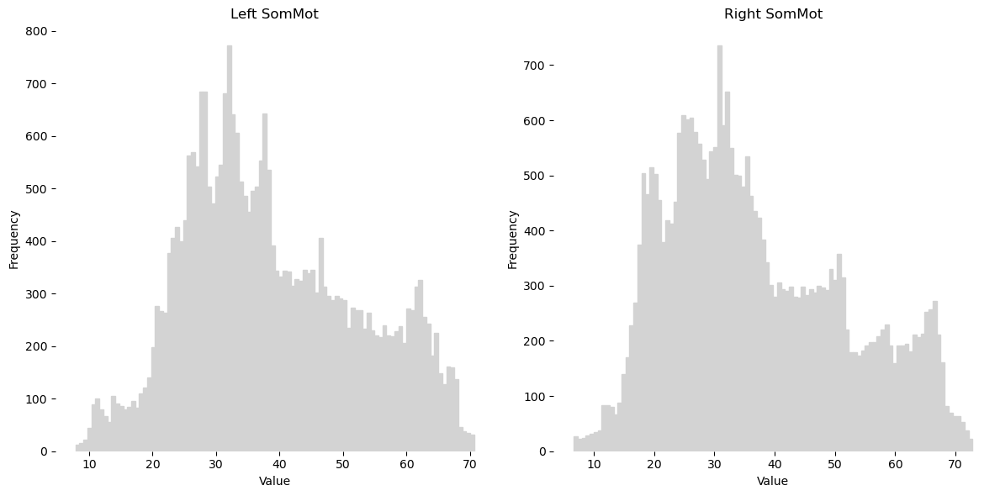

In [9]:
# Create a figure and a set of subplots with 1 row and 2 columns
fig, (ax1, ax2) = mpl.subplots(1, 2, figsize=(12, 6))

# Plot histogram for arrayA
ax1.hist(networks[1][0:32492], bins=100, color='lightgray', edgecolor='lightgray')
ax1.set_title('Left SomMot')
ax1.set_xlabel('Value')
ax1.set_ylabel('Frequency')

# Plot histogram for arrayB
ax2.hist(networks[1][32492:], bins=100, color='lightgray', edgecolor='lightgray')
ax2.set_title('Right SomMot')
ax2.set_xlabel('Value')
ax2.set_ylabel('Frequency')

# Remove the box (spines) from both plots
for ax in [ax1, ax2]:
    for spine in ax.spines.values():
        spine.set_visible(False)

# Adjust layout
mpl.tight_layout()

# Show the plot
mpl.show()


# Colormaps

Check this colormap catalog: https://cmap-docs.readthedocs.io/en/latest/catalog/

# Scientific colormaps aka crameri
https://www.fabiocrameri.ch

In [12]:
from cmcrameri import cm


netSomMot=[None] * 7
for i in range(7):
    netSomMot[i] = networks[1]

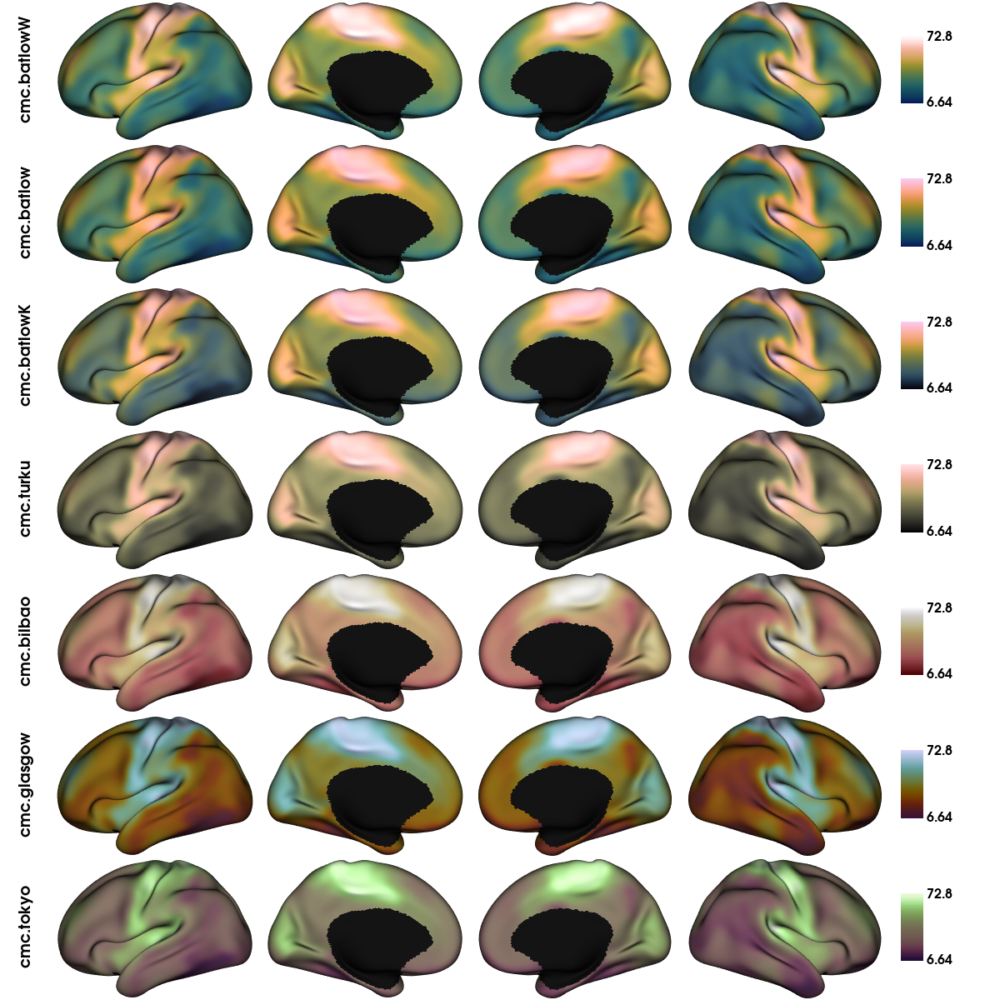

In [13]:
cmc7 = ['cmc.batlowW', 'cmc.batlow', 'cmc.batlowK', 'cmc.turku', 'cmc.bilbao',  
       'cmc.glasgow',  'cmc.tokyo']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmc7,
                 embed_nb=True, label_text={'left':cmc7}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

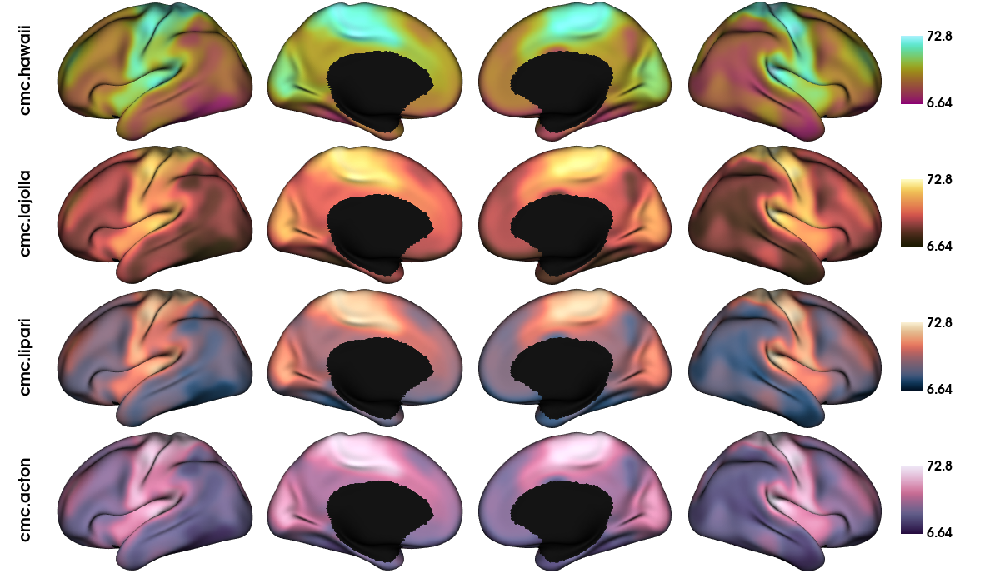

In [14]:
cmc7 = ['cmc.hawaii', 'cmc.lajolla', 'cmc.lipari', 'cmc.acton']

plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:4], size=(1200, 172*4), cmap=cmc7,
                 embed_nb=True, label_text={'left':cmc7}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

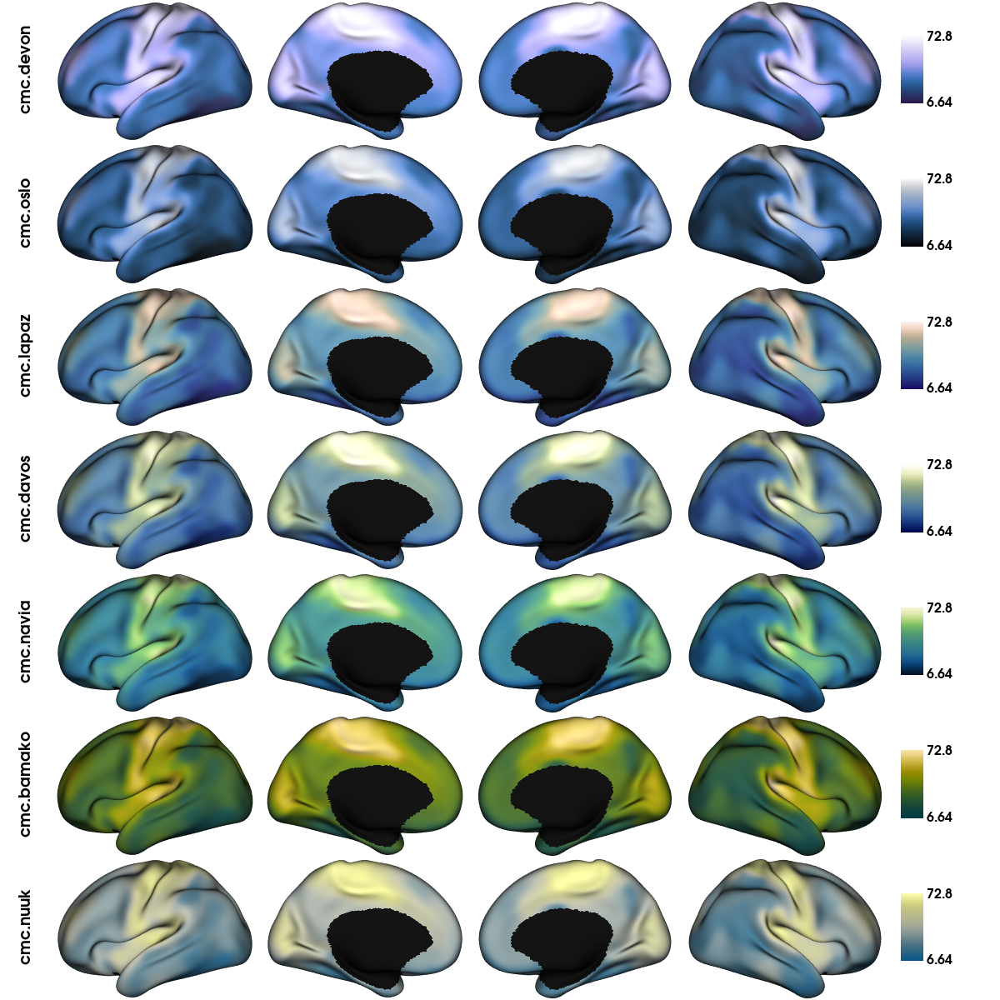

In [15]:
cmc7 = ['cmc.devon', 'cmc.oslo',  'cmc.lapaz', 'cmc.davos', 
        'cmc.navia', 'cmc.bamako', 'cmc.nuuk']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot, size=(1200, 1200), cmap=cmc7,
                 embed_nb=True, label_text={'left':cmc7}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

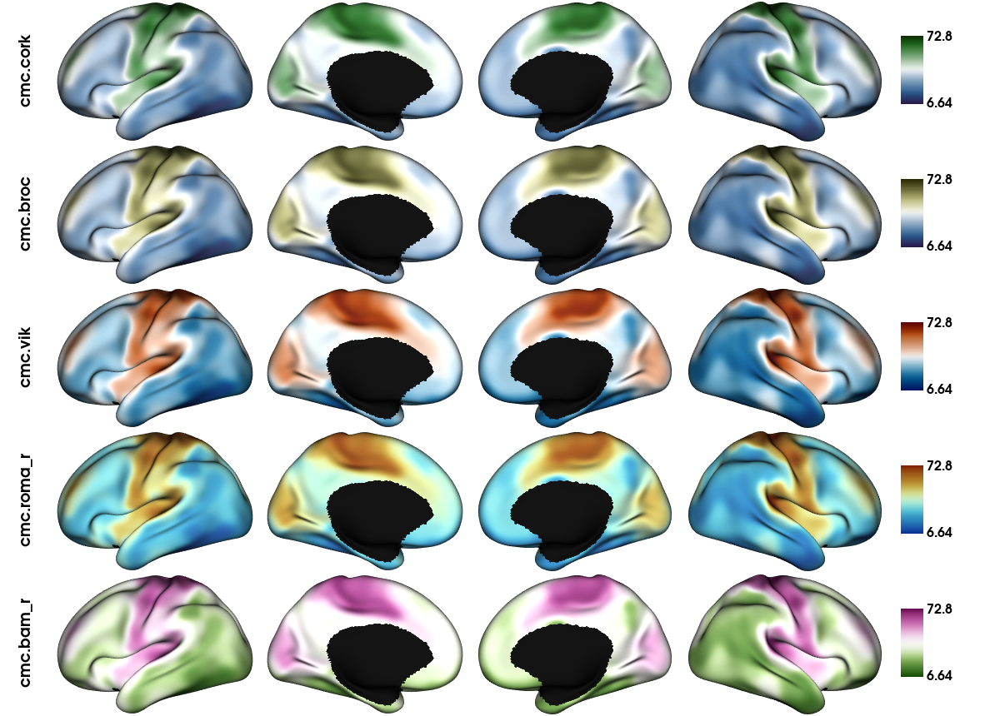

In [16]:
cmc5 = [ 'cmc.cork', 'cmc.broc',  'cmc.vik', 
        'cmc.roma_r','cmc.bam_r']

plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:5], size=(1200, 172*5), cmap=cmc5,
                 embed_nb=True, label_text={'left':cmc5}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

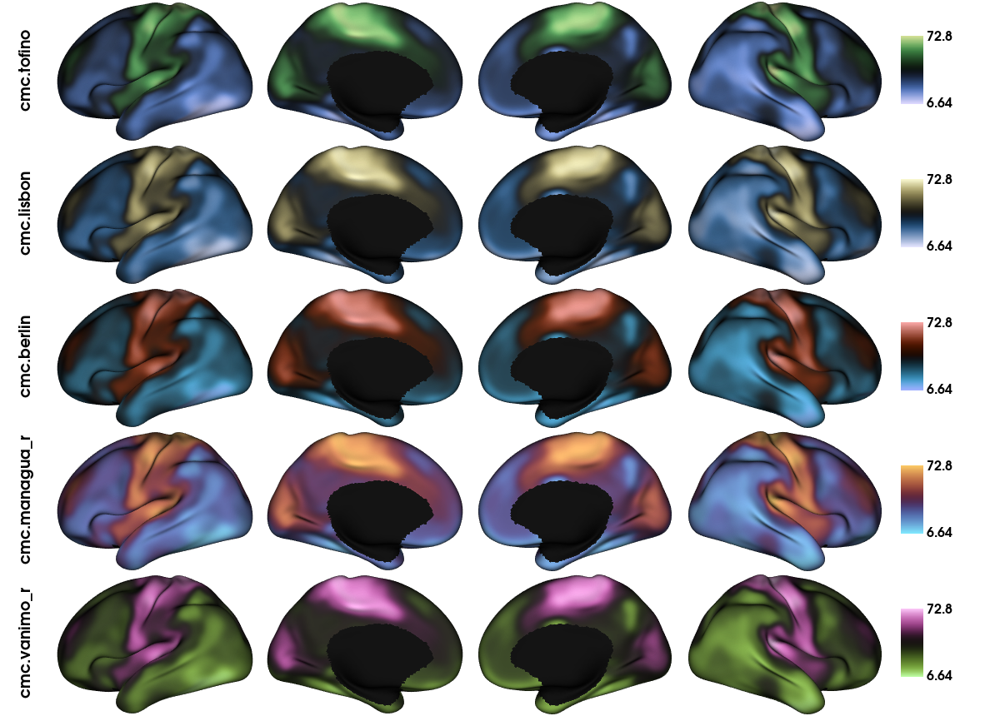

In [17]:
cmc5 = ['cmc.tofino', 'cmc.lisbon', 'cmc.berlin', 'cmc.managua_r', 'cmc.vanimo_r']

plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:5], size=(1200, 172*5), cmap=cmc5,
                 embed_nb=True, label_text={'left':cmc5}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

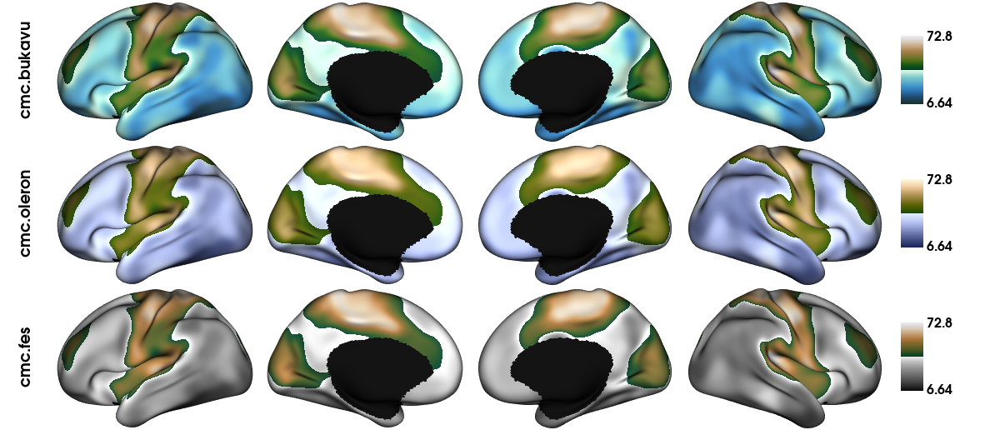

In [18]:
cmc3 = ['cmc.bukavu','cmc.oleron', 'cmc.fes']
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:3], size=(1200, 172*3), cmap=cmc3,
                 embed_nb=True, label_text={'left':cmc3}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

# proplot
https://proplot.readthedocs.io/en/latest/colormaps.html 

## NO `_r` colormaps in proplot

In [19]:
import proplot as pplt

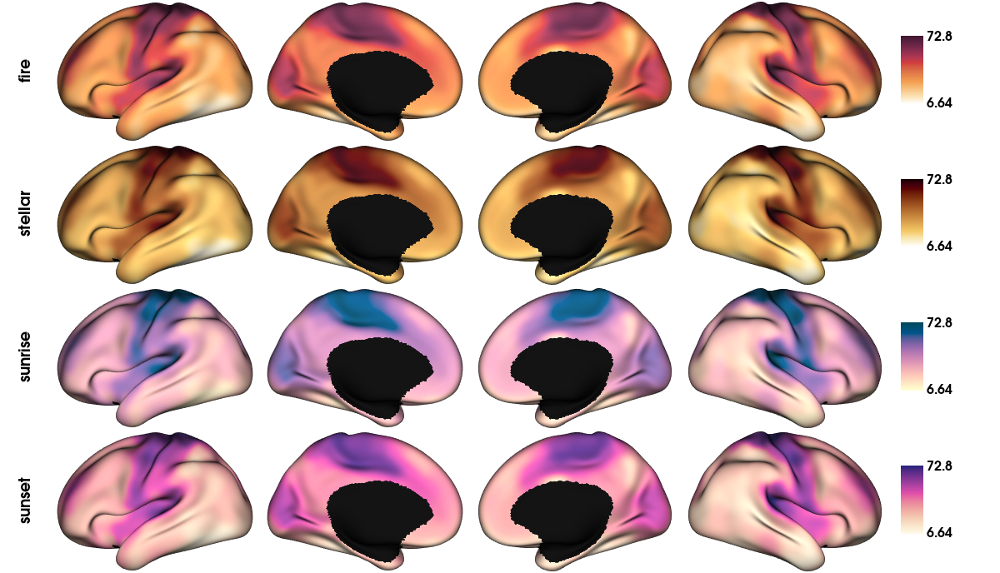

In [20]:
pplt_seq = ['fire', 'stellar', 'sunrise', 'sunset' ]

plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:4], size=(1200, 172*4), cmap=pplt_seq,
                 embed_nb=True, label_text={'left':pplt_seq}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

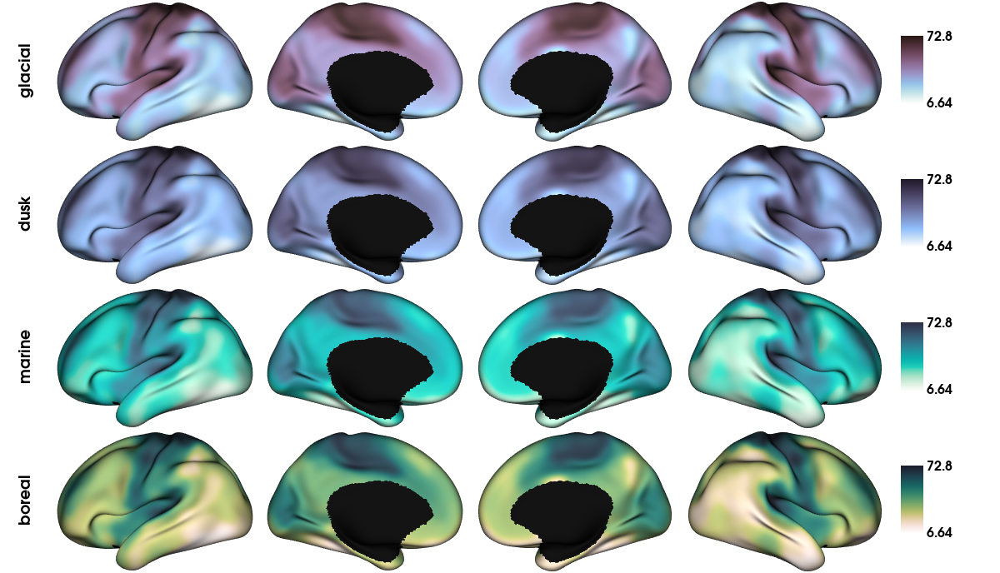

In [21]:
pplt_seq = ['glacial', 'dusk', 'marine', 'boreal']

plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:4], size=(1200, 172*4), cmap=pplt_seq,
                 embed_nb=True, label_text={'left':pplt_seq}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

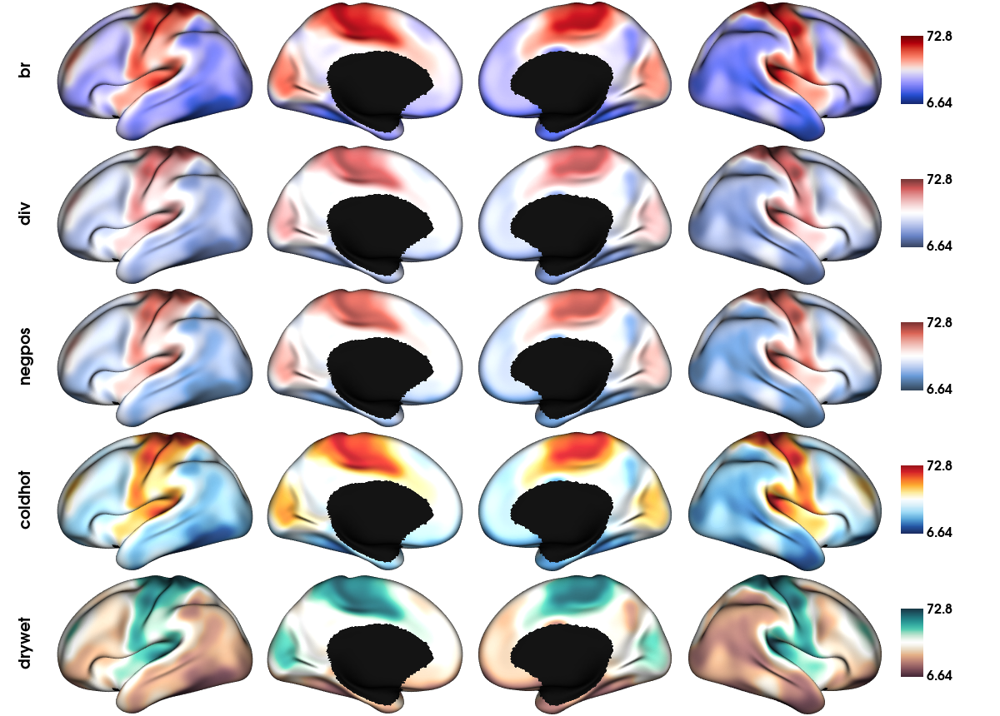

In [22]:
pplt_div = ['br', 'div', 'negpos', 'coldhot', 'drywet' ]
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:5], size=(1200, 172*5), cmap=pplt_div,
                 embed_nb=True, label_text={'left':pplt_div}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)

# colormaps
https://pratiman-91.github.io/colormaps/

> Note: `cmaps` already exists will import it on `clrmps` instead

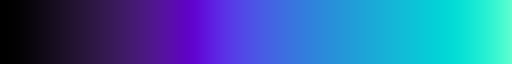

In [23]:
import colormaps as clrmps
clrmps.cosmic


This may take some time... Please be patient.


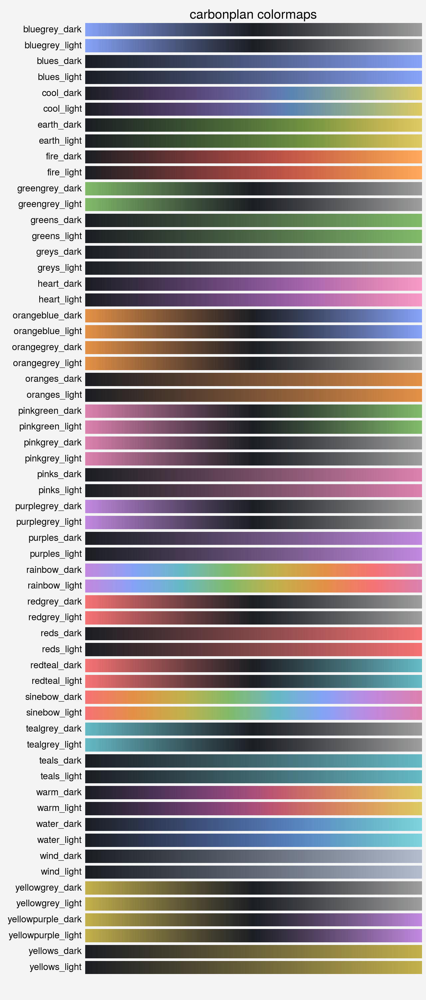

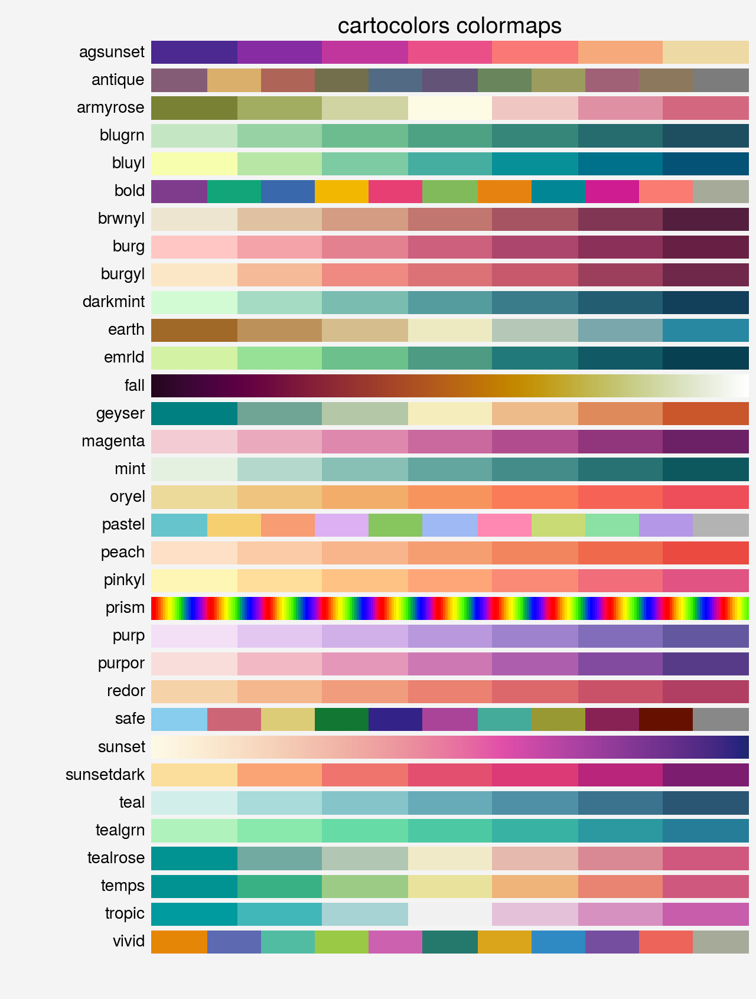

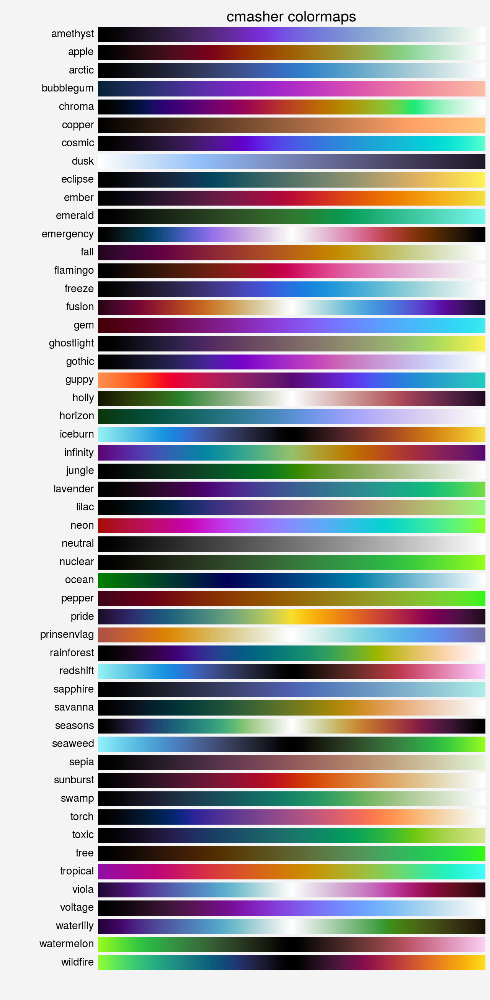

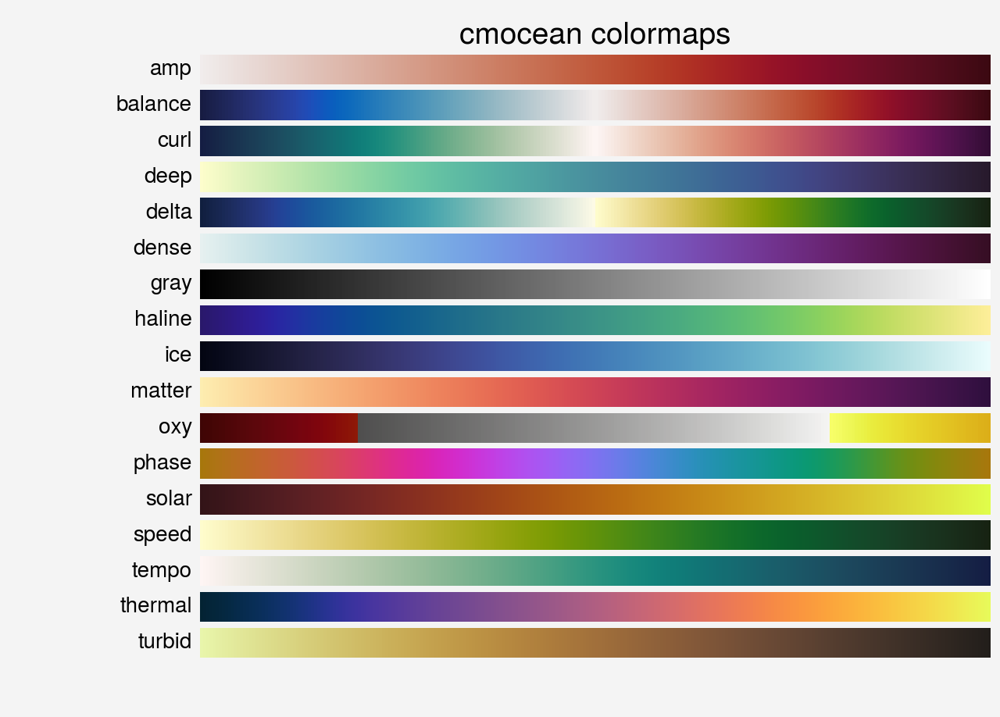

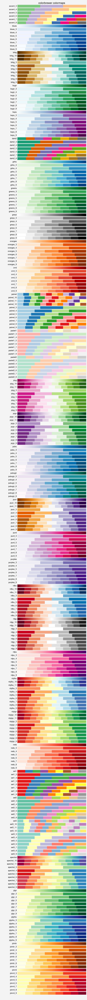

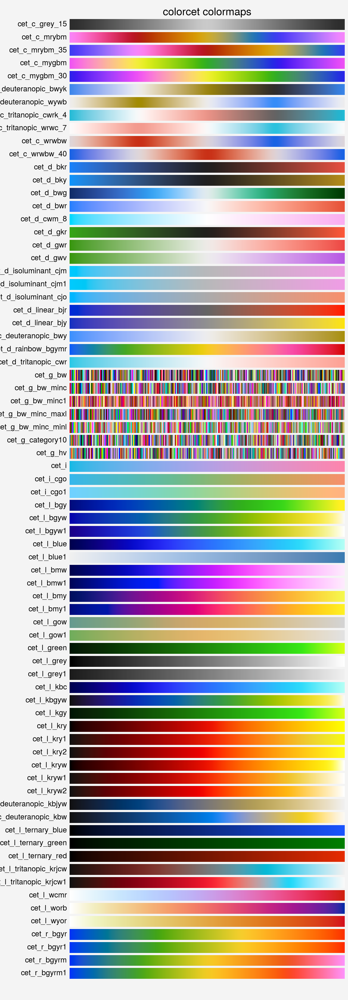

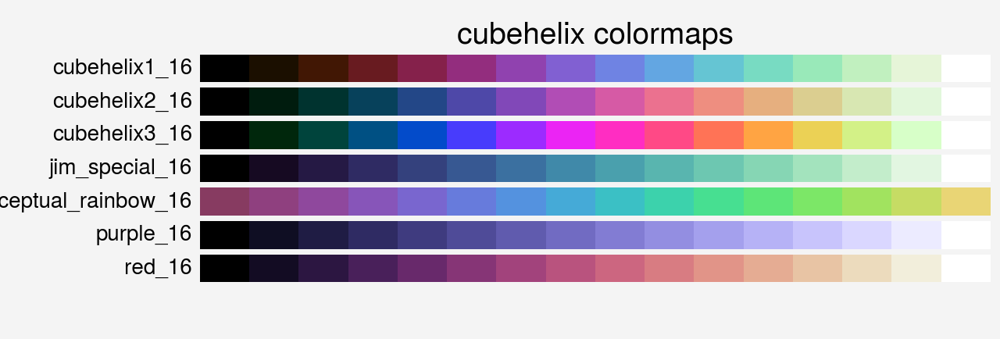

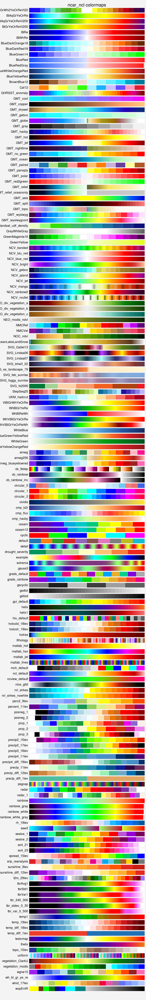

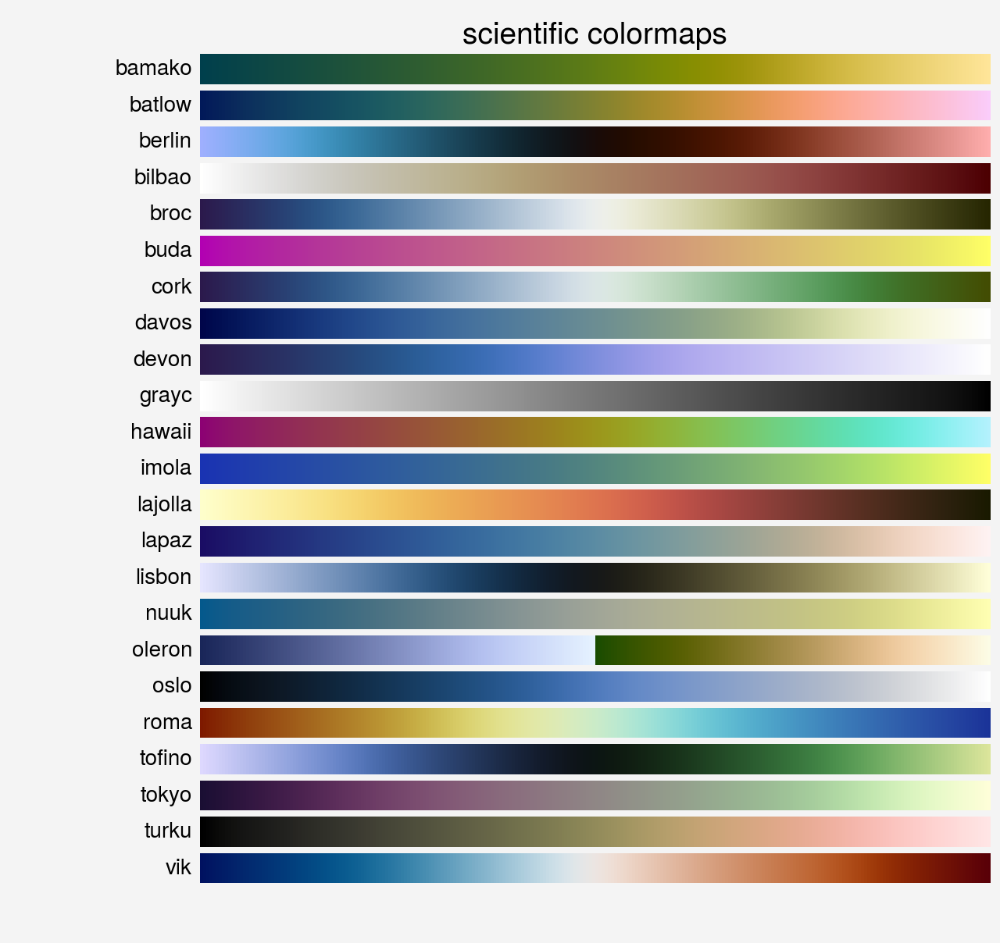

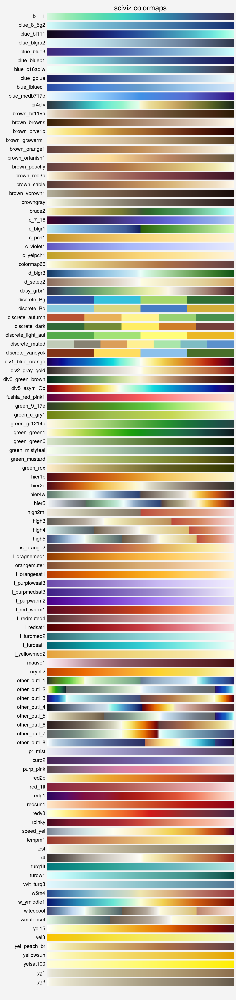

In [25]:
from colormaps.utils import show_cmaps_all
show_cmaps_all()

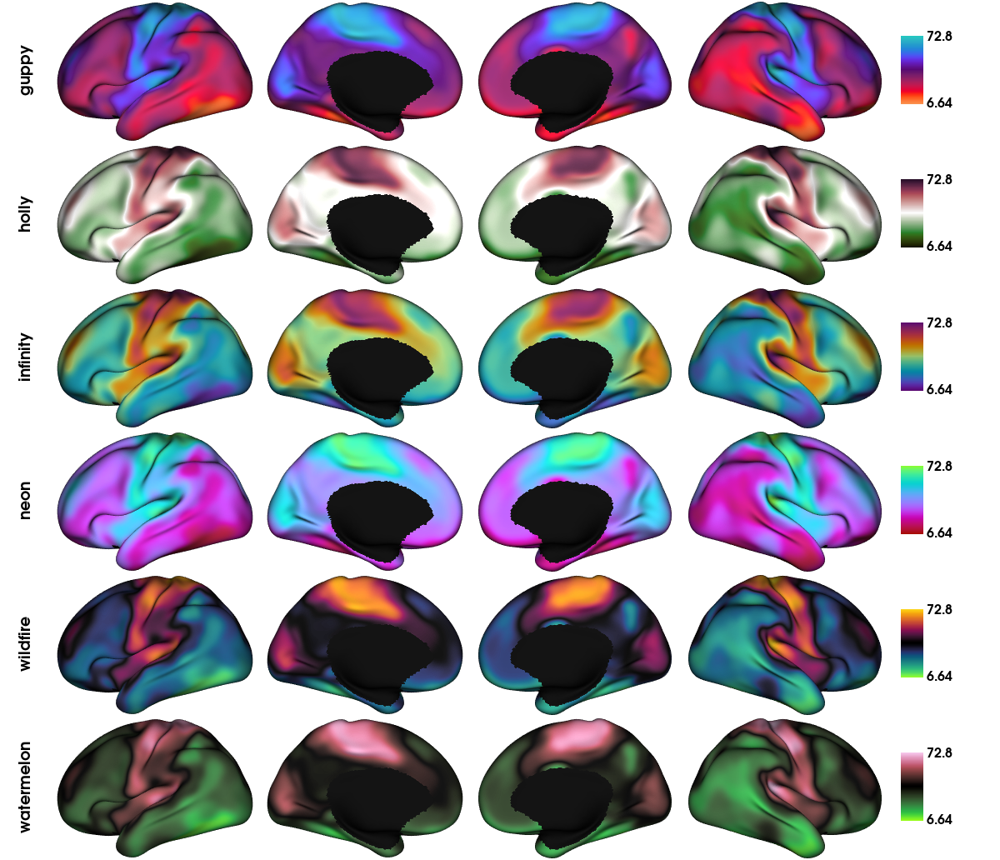

In [27]:
pplt_div = ['guppy', 'holly', 'infinity', 'neon', 'wildfire', 'watermelon' ]
N=len(pplt_div)
plot_hemispheres(c69_lhi, c69_rhi, array_name=netSomMot[0:N], size=(1200, 172*N), cmap=pplt_div,
                 embed_nb=True, label_text={'left':pplt_div}, color_bar='right', color_range='sym',
                 zoom=1.75, nan_color=(0, 0, 0, 1), interactive=False, background=(0,0,0),
                screenshot=False)